In [53]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime

from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

from sklearn.metrics import mean_squared_error

import statsmodels.api as sm
from scipy.optimize import curve_fit

# Read data

In [8]:
dateparse = lambda dates: datetime.strptime(dates, '%Y-%m-%d')
data = pd.read_csv('NFLX.csv', parse_dates=['Date'], date_parser=dateparse)

In [12]:
def plot_series(x, y, title, labels):

    fig = go.Figure()
    
    for i in range(len(y)):
        fig.add_trace(go.Scatter(x=x, y=y[i], name=labels[i]))

    fig.update_layout(
        title=title,
        margin=dict(l=60, r=40, t=80, b=40),
        height=600,
    )

    fig.show()

# Trend estimation (polinomial fit)

In [5]:
def estimation(x, y, deg, name):
    coefs = np.polyfit(x, y, deg)
    vals = np.polyval(coefs, x)
    TS = pd.Series(data=vals, index=x, name=name)
    
    return TS

MSE linear estimation: 8316.528
MSE quadatric estimation: 1698.974
MSE cubic estimation: 776.399


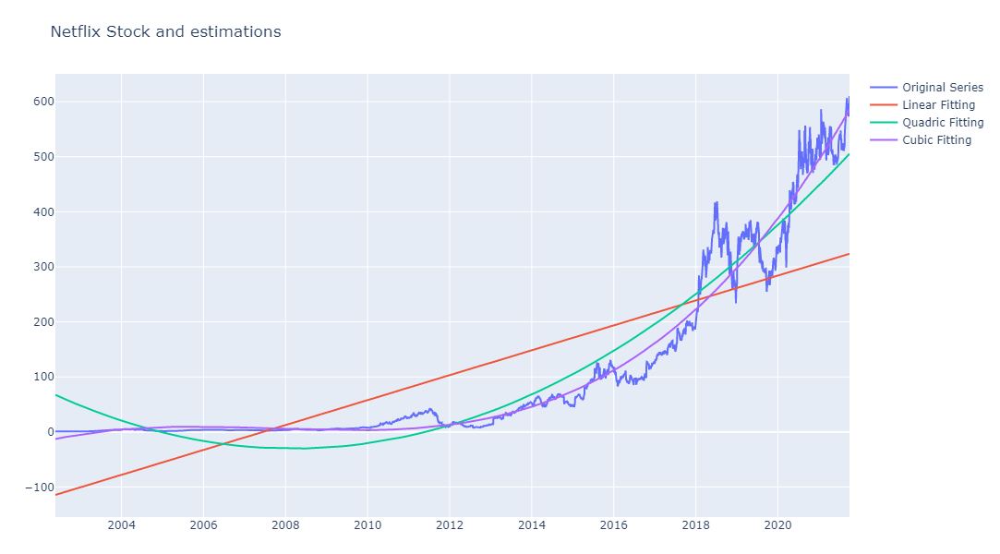

In [15]:
# Linear estimation
linTS = estimation(data.index, np.array(data["Close"]), 1, 'Linear Fitting')

# Quadratic estimation
quadTS = estimation(data.index, np.array(data["Close"]), 2, 'Quadratic Fitting')

# Cubic estimation
cubTS = estimation(data.index, np.array(data["Close"]), 3, 'Cubic Fitting')

print('MSE linear estimation:', round(mean_squared_error(data['Close'], linTS), 3))
print('MSE quadatric estimation:', round(mean_squared_error(data['Close'], quadTS), 3))
print('MSE cubic estimation:', round(mean_squared_error(data['Close'], cubTS), 3))

plot_series(
    data['Date'], 
    [data['Close'], linTS, quadTS, cubTS], 
    'Netflix Stock and estimations', 
    ['Original Series', 'Linear Fitting', 'Quadric Fitting', 'Cubic Fitting']
)

# Remove trend

### Additive model

In [23]:
def remove_trend(series, estimation):
    data_no_trend = series - estimation
    return data_no_trend

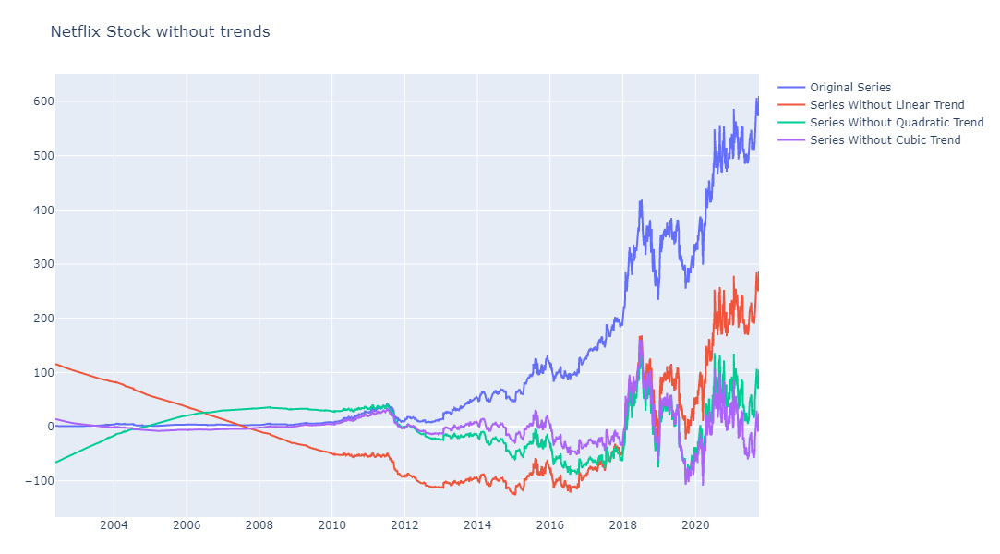

In [24]:
no_lin_trend = remove_trend(data["Close"].values, linTS.values)
no_quad_trend = remove_trend(data["Close"].values, quadTS.values)
no_cub_trend = remove_trend(data["Close"].values, cubTS.values)

plot_series(
    data['Date'], 
    [data['Close'], no_lin_trend, no_quad_trend, no_cub_trend], 
    'Netflix Stock without trends', 
    ['Original Series', 'Series Without Linear Trend', 'Series Without Quadratic Trend', 'Series Without Cubic Trend']
)

### Multiplicative model

In [51]:
def divided_trend(data, trend):
    data_no_trend = data.values/trend.values
    
    indexes = np.where((data_no_trend > (3 * np.std(data_no_trend))) | (data_no_trend < (-3 * np.std(data_no_trend))))
    if not indexes:
        data_no_trend[indexes] = np.nan
    
    return data_no_trend

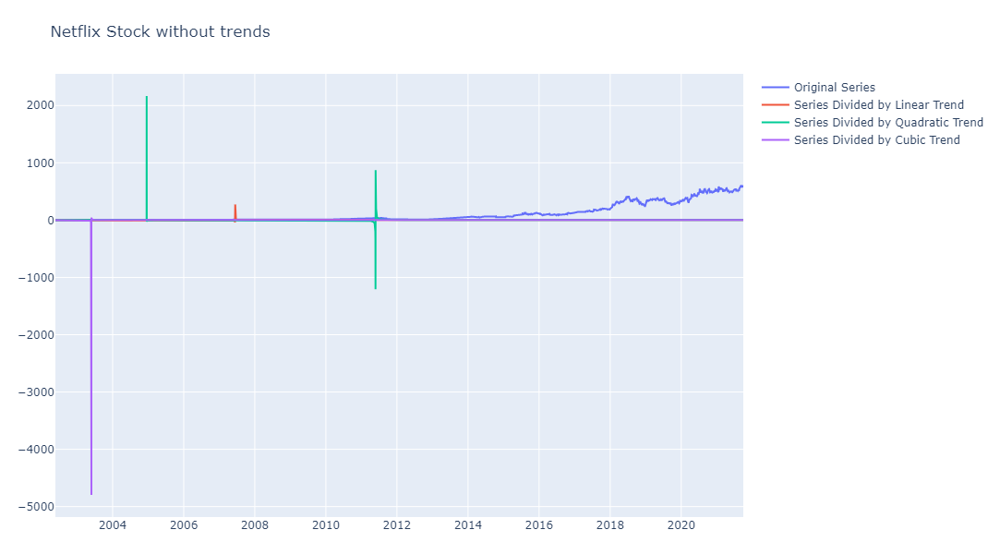

In [28]:
data_no_lin_trend = divided_trend(data["Close"].values, linTS.values)
data_no_quad_trend = divided_trend(data["Close"].values, quadTS.values)
data_no_cub_trend = divided_trend(data["Close"].values, cubTS.values)
b
plot_series(
    data['Date'], 
    [data['Close'], data_no_lin_trend, data_no_quad_trend, data_no_cub_trend], 
    'Netflix Stock without trends', 
    ['Original Series', 'Series Divided by Linear Trend', 'Series Divided by Quadratic Trend', 'Series Divided by Cubic Trend']
)

### Pseudo-additive ???

# Moving average

In [37]:
def maSmooth(TSeries, omega, data_aug=False):
    M = omega.shape[0]
    lag = int(np.floor((M - 1) / 2))
    
    if data_aug: # Para corrigir início e fim por não terem M valores para calcular MA
        TSeriesAug = pd.Series(np.concatenate((np.flip(TSeries[:lag]), TSeries, np.flip(TSeries[-lag:]))))       
    else:
        TSeriesAug = TSeries
        
    nf = range(lag, TSeriesAug.size - lag)
    xf = np.zeros(TSeriesAug.size - 2 * (lag)).astype('float')
    
    sum_omega_k = 1 / float(sum(omega))
    for n in nf:
        xf[n - lag] = sum_omega_k * np.sum(np.multiply(TSeriesAug[n - lag:n + lag + 1], omega))
    xf = pd.Series(data=xf, index=TSeriesAug.index[lag:TSeriesAug.size - lag], name="Smoothed TS with M=" + str(M))
    
    return xf

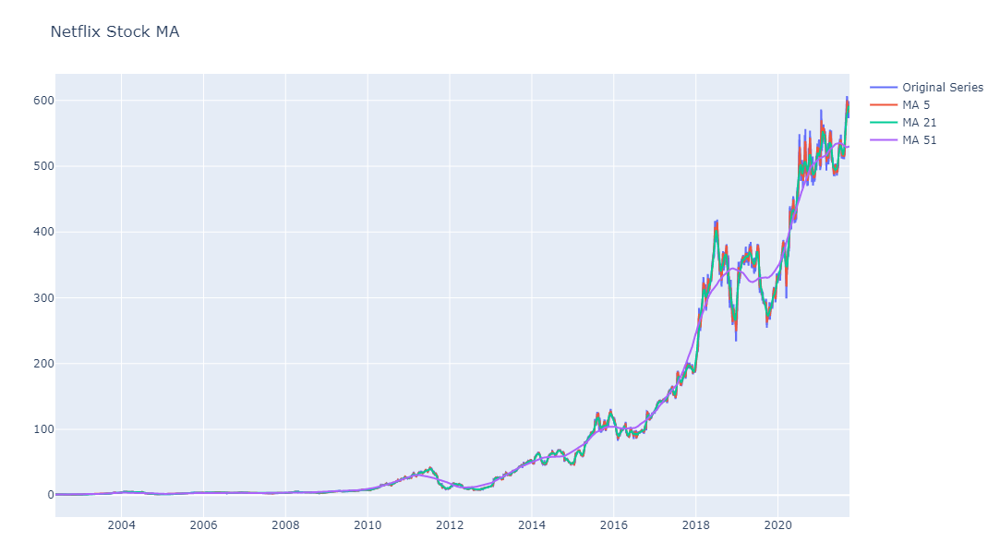

In [38]:
init = 0
end = -1

M = 5
omega = np.ones(M) * (1 / float(M))
smooth5 = maSmooth(data["Close"][init:end], omega, data_aug=True)

M = 21
omega = np.ones(M) * (1 / float(M))
smooth21 = maSmooth(data["Close"][init:end], omega, data_aug=True)

M = 251
omega = np.ones(M) * (1 / float(M))
smooth51 = maSmooth(data["Close"][init:end], omega, data_aug=True)

plot_series(
    data['Date'][init:end], 
    [data["Close"][init:end], smooth5, smooth21, smooth51], 
    'Netflix Stock MA', 
    ['Original Series', 'MA 5', 'MA 21', 'MA 51']
)

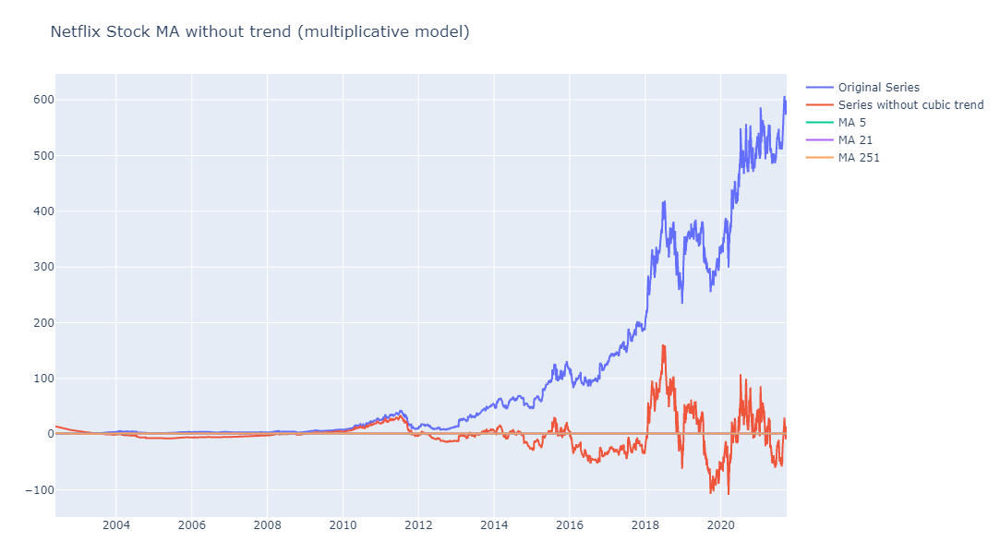

In [52]:
trend_ma5 = divided_trend(data["Close"][init:end], smooth5)
trend_ma21 = divided_trend(data["Close"][init:end], smooth21)
trend_ma51 = divided_trend(data["Close"][init:end], smooth51)

plot_series(
    data['Date'][init:end], 
    [data["Close"][init:end], no_cub_trend, trend_ma5, trend_ma21, trend_ma51], 
    'Netflix Stock MA without trend (multiplicative model)', 
    ['Original Series', 'Series without cubic trend', 'MA 5', 'MA 21', 'MA 251']
)

# Trend with dif

Text(0.5, 42.0, 'Time')

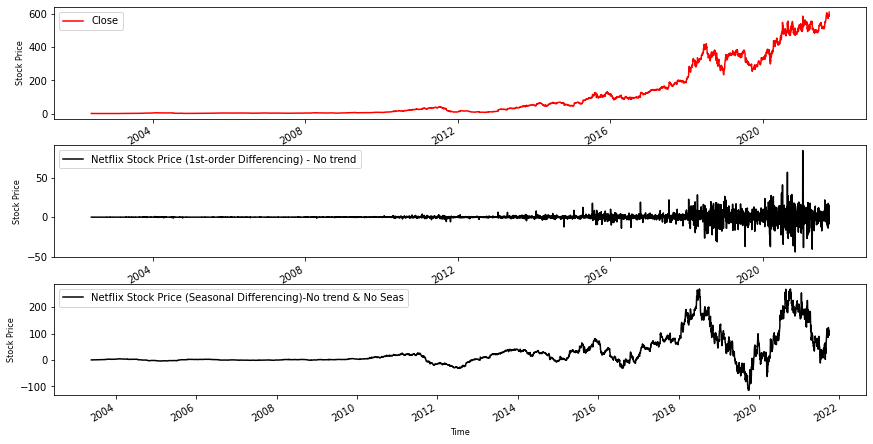

In [60]:
fig, axs = plt.subplots(3, figsize=(12, 7))
fig.tight_layout()

data["Close"].plot(ax=axs[0],legend=True,color='r')
axs[0].set_ylabel('Stock Price', fontdict={'fontsize':8})
axs[0].set_xlabel('Time', fontdict={'fontsize':8})

d1psTS = data["Close"].diff()
d1psTS.name = "Netflix Stock Price (1st-order Differencing) - No trend"
d1psTS.plot(ax=axs[1], legend=True, color='k')
axs[1].set_ylabel('Stock Price', fontdict={'fontsize':8})
axs[1].set_xlabel('Time', fontdict={'fontsize':8})

d1psTS = data["Close"].diff(252)
d1psTS.name = "Netflix Stock Price (Seasonal Differencing)-No trend & No Seas"
d1psTS.plot(ax=axs[2], legend=True, color='k')
axs[2].set_ylabel('Stock Price', fontdict={'fontsize':8})
axs[2].set_xlabel('Time', fontdict={'fontsize':8})

# LOESS/LOWESS

In [56]:
def xWeights(x,xi,span):
    wi=(1-abs((x-xi)/float(span))**3)**3
    #plt.figure()
    #plt.plot(wi)
    return wi

def yWeights(ri,MAD):
    if np.abs(ri)<6*MAD:
        return (1-((ri/(6*MAD))**2))**2
    else:
        return 0


def loessPass(TSeries,TSeriesE=pd.Series(np.array([])),span=5,timePass=True):
    lag=int((span-1)/2)
    xf=np.zeros(TSeries.size).astype('float')
    for k in range(TSeries.size):
        if k<=lag:
            win=TSeries[0:span]
            if not timePass:
                winE=TSeriesE[0:span]
            xvs=np.array(range(span))
            #print "No inicio"
        elif k>TSeries.size-lag:
            #print "No fim"
            win=TSeries[TSeries.size-span:TSeries.size]
            if not timePass:
                winE=TSeriesE[TSeriesE.size-span:TSeriesE.size]
            xvs=np.array(range(TSeries.size-span,TSeries.size))
        else:
            #print "No meio"
            win=TSeries[k-lag-1:k+lag]
            if not timePass:
                winE=TSeriesE[k-lag-1:k+lag]
            xvs=np.array(range(k-lag,k+lag+1))

        ws=np.zeros(span).astype('float')
            
        if not timePass:
            res=np.array(win-winE)
            #res=res.as_matrix()
            MAD=np.median(np.abs(res))
            
        for xw in range(len(xvs)):
            if timePass:
                ws[xw]=xWeights(k,xvs[xw],np.max((np.abs(k-xvs[0]),np.abs(k-xvs[-1]))))
            else:
                ws[xw]=yWeights(res[xw],MAD)
            #print np.max((np.abs(k-xvs[0]),np.abs(k-xvs[-1])))
        exog = sm.add_constant(xvs)
        
        
        mod_wls = sm.WLS(win, exog, weights=ws)
        res_wls = mod_wls.fit()
        
        xf[k]=res_wls.params[1]*k+res_wls.params[0]
    return xf

def lowess(TSeries,span=5):
    
    xf=loessPass(TSeries,span=span,timePass=True)
    xf=loessPass(TSeries,TSeriesE=pd.Series(data=xf, index=TSeries.index),span=span,timePass=False)
    xf=pd.Series(data=xf, index=TSeries.index,name="Smoothed TS with M="+str(span))
    return xf

In [55]:
init = 0
end = -1

span = 5
lowess5 = lowess(data["Close"][init:end], span)

span = 15
lowess15 = lowess(data["Close"][init:end], span)

span = 45
lowess45 = lowess(data["Close"][init:end], span)

plot_series(
    data['Date'][init:end], 
    [data["Close"][init:end], lowess5, lowess15, lowess45], 
    'Netflix Stock LOWESS', 
    ['Original Series', 'LOWESS 5', 'LOWESS 15', 'LOWESS 45']
)

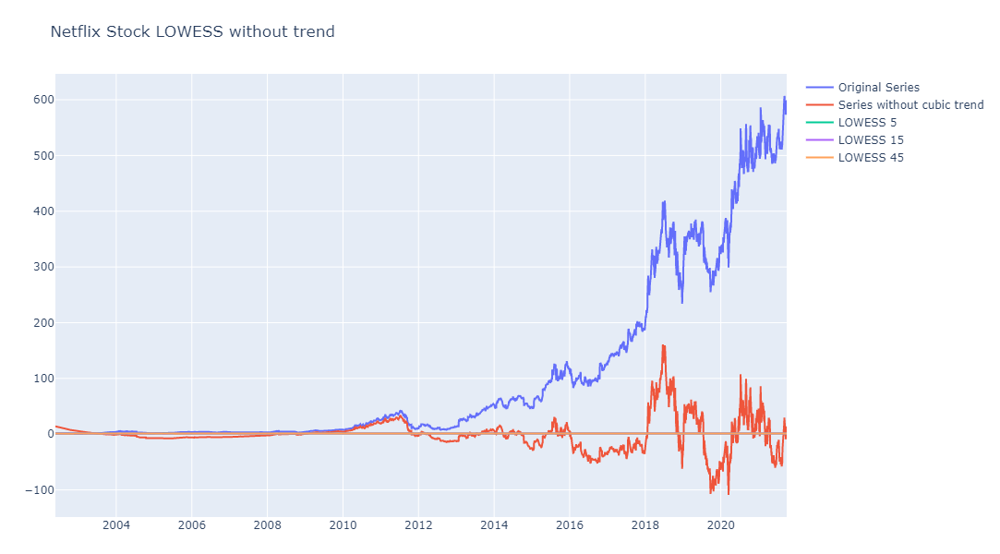

In [59]:
trend_lowess5 = divided_trend(data["Close"][init:end], lowess5)
trend_lowess15 = divided_trend(data["Close"][init:end], lowess15)
trend_lowess45 = divided_trend(data["Close"][init:end], lowess45)

plot_series(
    data['Date'][init:end], 
    [data["Close"][init:end], no_cub_trend, trend_lowess5, trend_lowess15, trend_lowess45], 
    'Netflix Stock LOWESS without trend', 
    ['Original Series', 'Series without cubic trend', 'LOWESS 5', 'LOWESS 15', 'LOWESS 45']
)

# ADF test (Dicky Fuller)

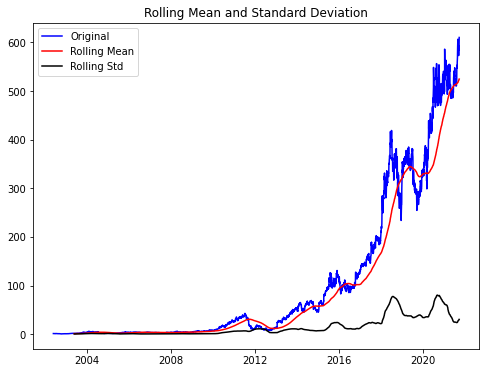

Results of dickey fuller test
(2.793546032249593, 1.0, 30, 4843, {'1%': -3.4317009744827818, '5%': -2.8621369803755154, '10%': -2.567087774109517}, 28372.6491903293)
Test Statistics                   2.793546
p-value                           1.000000
No. of lags used                 30.000000
Number of observations used    4843.000000
critical value (1%)              -3.431701
critical value (5%)              -2.862137
critical value (10%)             -2.567088
dtype: float64


In [61]:
from statsmodels.tsa.stattools import adfuller

data.index = data['Date']

def test_stationarity(timeseries):
    rolmean = timeseries.rolling(252).mean()
    rolstd = timeseries.rolling(252).std()
    
    #Plot rolling statistics:
    plt.figure(figsize=(8, 6))
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    print(adft)
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)
    
data_close = data['Close']
test_stationarity(data_close)

# Separate trend and seasonality

<Figure size 432x288 with 0 Axes>

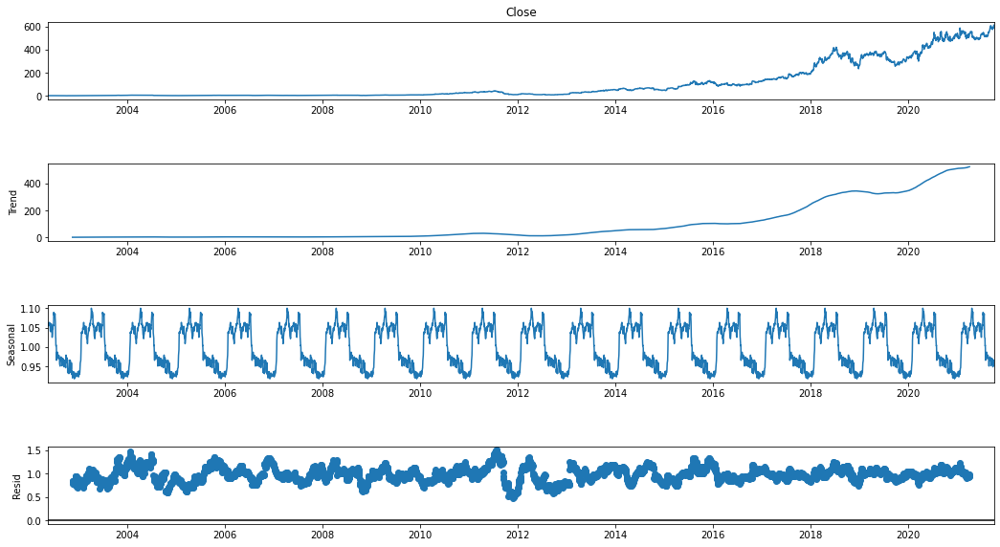

In [71]:
from statsmodels.tsa.seasonal import seasonal_decompose

data_close = data['Close']
data_close.index = data['Date']

result = seasonal_decompose(data_close, model='multiplicative', period=252)
fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(16, 9)

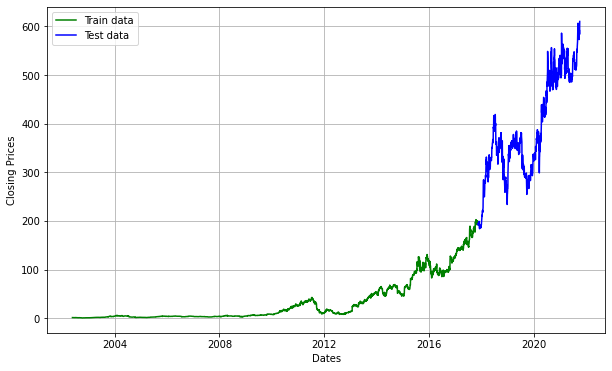

In [76]:
train_data, test_data = np.split(data_close, [int(.8*len(data_close))])

plt.figure(figsize=(10,6))
plt.grid(True)
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(train_data, 'green', label='Train data')
plt.plot(test_data, 'blue', label='Test data')
plt.legend()

In [77]:
model_autoARIMA = auto_arima(train_data, start_p=0, start_q=0,
                      test='adf',       # use adftest to find             optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_autoARIMA.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=13577.318, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=13575.584, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=13575.625, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=13580.411, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=13577.471, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=13577.467, Time=0.29 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.68 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=13578.366, Time=0.08 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0] intercept
Total fit time: 3.946 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 3899
Model:               SARIMAX(1, 1, 0)   Log Likelihood               -6784.792
Date:                Mon, 29 Nov 2021   AIC                          13575.584
Time:                        23:34

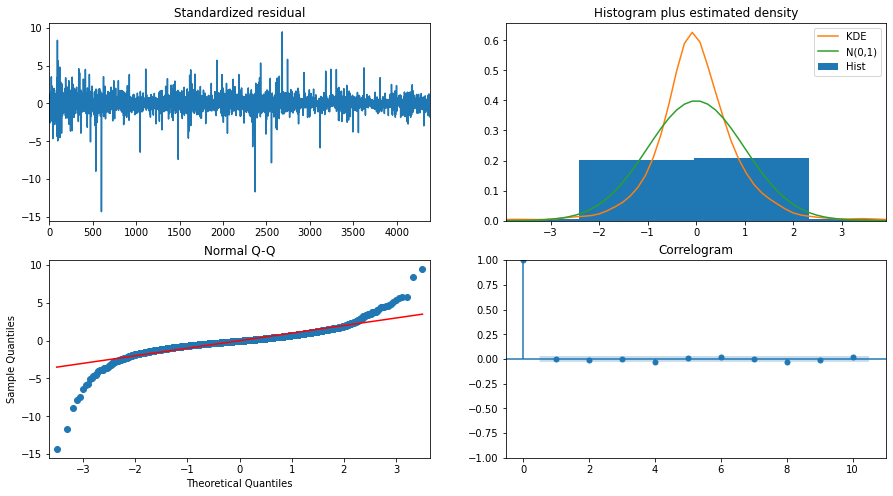

In [8]:
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [84]:
from sklearn.metrics import mean_squared_error

errors_mse = {}
errors_aic = {}
for p in range(5):
    for q in range(3):
#         for P in range(3):
#             for Q in range(2):
        model = ARIMA(train_data, order=(p, 1, q))
#                       , seasonal_order=(P, 1, Q, 12))  
        fitted = model.fit()  

        fc = fitted.forecast(test_data.shape[0], alpha=0.05)  # 95% confidence

        errors_mse[(p,q)] = mean_squared_error(test_data.values, fc.values)   
        errors_aic[(p,q)] = fitted.aic
        print(f'p={p}, q={q}, {round(errors_mse[(p,q)], 5)}')

p=0, q=0, 48734.01212
p=0, q=1, 48727.40568
p=0, q=2, 48716.90594
p=1, q=0, 48725.80215
p=1, q=1, 48715.61188
p=1, q=2, 48714.27142
p=2, q=0, 48715.92784
p=2, q=1, 48714.43924
p=2, q=2, 48715.92476
p=3, q=0, 48710.4205
p=3, q=1, 48709.46218
p=3, q=2, 48792.6072
p=4, q=0, 48705.88676
p=4, q=1, 48678.3639
p=4, q=2, 48722.52484


Best parameters MSE: 4, 1
MSE: 48678.36390109206
Best parameters AIC: 3, 2
MSE: 13562.299388561096


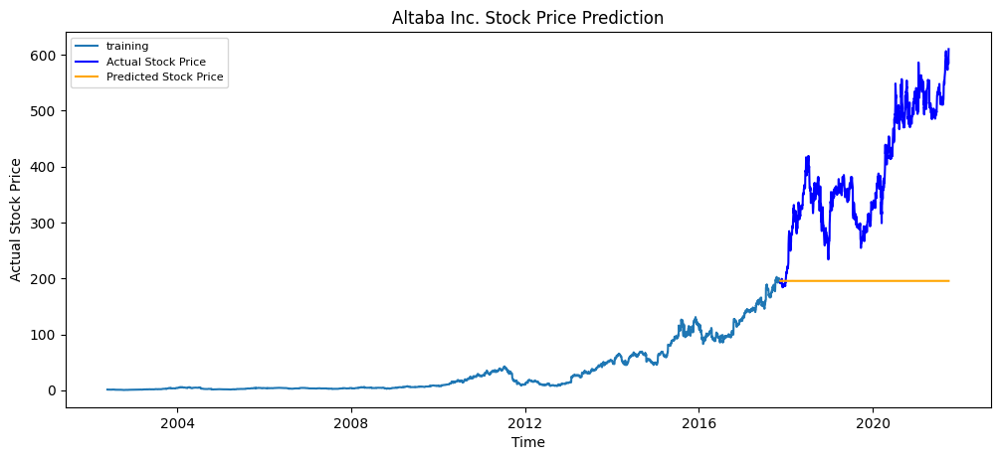

In [90]:
# Best with seasonality MSE: 4, 1, 2, 0
# Best without seasonality MSE: 4, 1, MSE: 48678.36390109206
# Best without seasonality AIC: 3, 2, MSE: 13562.299388561096

best_parameters_mse = min(errors_mse, key=errors_mse.get)
print(f'Best parameters MSE: {best_parameters_mse[0]}, {best_parameters_mse[1]}\nMSE: {errors_mse[best_parameters_mse]}')

best_parameters_aic = min(errors_aic, key=errors_aic.get)
print(f'Best parameters AIC: {best_parameters_aic[0]}, {best_parameters_aic[1]}\nMSE: {errors_aic[best_parameters_aic]}')

model = ARIMA(train_data, order=(best_parameters_aic[0], 1, best_parameters_aic[1]))  
fitted = model.fit()
fc = fitted.forecast(test_data.shape[0], alpha=0.05)  # 95% confidence
fc_series = pd.Series(fc)
fc_series.index = test_data.index

plt.figure(figsize=(12,5), dpi=100)
plt.plot(train_data, label='training')
plt.plot(test_data, color = 'blue', label='Actual Stock Price')
plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')

plt.title('Altaba Inc. Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Actual Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()